# Import modules

In [23]:
import pandas as pd
import networkx as nx
import statistics as st
import matplotlib.pyplot as plt
import os
from functions import *
path = os.getcwd()
path

'/Users/josephbarbier/Desktop/M1S2/réseaux/projet/Travail Analyse des réseaux  consignes et données'

<br>
<br>

# Open csv files

In [2]:
#load edges data
edges_df = pd.read_csv(f"{path}/edges_cluster_G.csv", sep=";")
edges = nx.from_pandas_edgelist(edges_df, "source", "target", edge_attr=True)
edges_df.tail()

,source,target,pre_link,post_link
4191,7474,116611,0,1
4192,43546,116611,0,1
4193,36924,116611,0,1
4194,7463,116611,0,1
4195,36926,116611,0,1


In [3]:
#load nodes data
nodes_df = pd.read_csv(f"{path}/nodes_cluster_G.csv", sep=";")
nodes_df.head()

,id,coord,core,gender
0,12948,0,0,0
1,8295,0,1,0
2,12924,0,0,1
3,12925,0,1,0
4,7440,1,1,0


<br>
<br>

# Create a before and after graphs

In [4]:
# Graph for before-treatment period
before_graph = nx.Graph()
before_graph.add_nodes_from(nodes_df['id']) # add all nodes to the graph
before_edges = edges_df[edges_df['pre_link'] == 1]  # filter edges with pre-link = 1
before_graph.add_edges_from(zip(before_edges['source'], before_edges['target'])) # add edges of the before-treatment period

# Graph for after-treatment period
after_graph = nx.Graph() 
after_graph.add_nodes_from(nodes_df['id']) # add all nodes to the graph
after_edges = edges_df[edges_df['post_link'] == 1]  # filter edges with post-link = 1
after_graph.add_edges_from(zip(after_edges['source'], after_edges['target'])) # add edges of the after-treatment period

before_degrees = list(dict(before_graph.degree()).values())
after_degrees = dict(after_graph.degree()).values()

In [5]:
print(before_graph.number_of_nodes())
print(after_graph.number_of_nodes())

381
381


<br>
<br>

# Preliminary analyses

In [6]:
# Compute network statistics for before-treatment graph
before_edges = len(before_graph.edges())
before_avg_degree = sum(dict(before_graph.degree()).values()) / before_graph.number_of_nodes()

# Print network statistics
print("Number of edges:")
print(f"Before: {before_edges}")
print(f"After: {after_edges}")
print(f"Variation of {(after_edges-before_edges)/before_edges*100}%\n")

new_edges = len(edges_df[(edges_df["pre_link"] == 0) & (edges_df["post_link"] == 1)])/2
print(f"Number of new edges: {new_edges}")
lost_edges = len(edges_df[(edges_df["pre_link"] == 1) & (edges_df["post_link"] == 0)])/2
print(f"Number of new edges: {lost_edges}")

Number of edges:
Before: 1251
After:       source  target  pre_link  post_link
18     54365    2684         1          1
20     12933    2684         0          1
25     54393    2684         1          1
28     22692    2684         0          1
30      2687    2684         0          1
...      ...     ...       ...        ...
4191    7474  116611         0          1
4192   43546  116611         0          1
4193   36924  116611         0          1
4194    7463  116611         0          1
4195   36926  116611         0          1

[2880 rows x 4 columns]
Variation of            source       target    pre_link  post_link
18    4245.723421   114.548361  -99.920064 -99.920064
20     933.812950   114.548361 -100.000000 -99.920064
25    4247.961631   114.548361  -99.920064 -99.920064
28    1713.908873   114.548361 -100.000000 -99.920064
30     114.788169   114.548361 -100.000000 -99.920064
...           ...          ...         ...        ...
4191   497.442046  9221.422862 -100.000000 

In [7]:
# Compute network statistics for after-treatment graph
after_edges = len(after_graph.edges())
after_avg_degree = sum(dict(after_graph.degree()).values()) / after_graph.number_of_nodes()

print("Stdev degree:")
print(f"Before: {round(st.stdev(before_degrees),2)}")
print(f"After: {round(st.stdev(after_degrees),2)}")
print(f"Variation of {(st.stdev(after_degrees)-st.stdev(before_degrees))/st.stdev(before_degrees)*100}%\n")

print("Average degree")
print(f"Before: {round(before_avg_degree,2)}")
print(f"After: {round(after_avg_degree,2)}")
print(f"Variation of {(after_avg_degree-before_avg_degree)/before_avg_degree*100}%\n")

Stdev degree:
Before: 6.71
After: 6.34
Variation of -5.517807570559504%

Average degree
Before: 6.57
After: 7.56
Variation of 15.107913669064748%



In [8]:
print(f"Before graph is connected : {nx.is_connected(before_graph)}")
print(f"After graph is connected : {nx.is_connected(after_graph)}")
print(f"\nBefore graph average clustering : {nx.average_clustering(before_graph)}")
print(f"After graph average clustering : {nx.average_clustering(after_graph)}")
print(f"Average clustering Variation : {round(100 * (nx.average_clustering(after_graph) - nx.average_clustering(before_graph))/nx.average_clustering(before_graph),2)} %")
print(f"\nBefore graph global clustering : {nx.transitivity(before_graph)}")
print(f"After graph global clustering : {nx.transitivity(after_graph)}")
print(f"Global clustering Variation : {round(100 * (nx.transitivity(after_graph) - nx.transitivity(before_graph))/nx.transitivity(before_graph),2)} %")

Before graph is connected : False
After graph is connected : False

Before graph average clustering : 0.3899577553838554
After graph average clustering : 0.4629465390866179
Average clustering Variation : 18.72 %

Before graph global clustering : 0.43520010311271506
After graph global clustering : 0.46194379391100704
Global clustering Variation : 6.15 %


<br>
<br>

# Some graphs

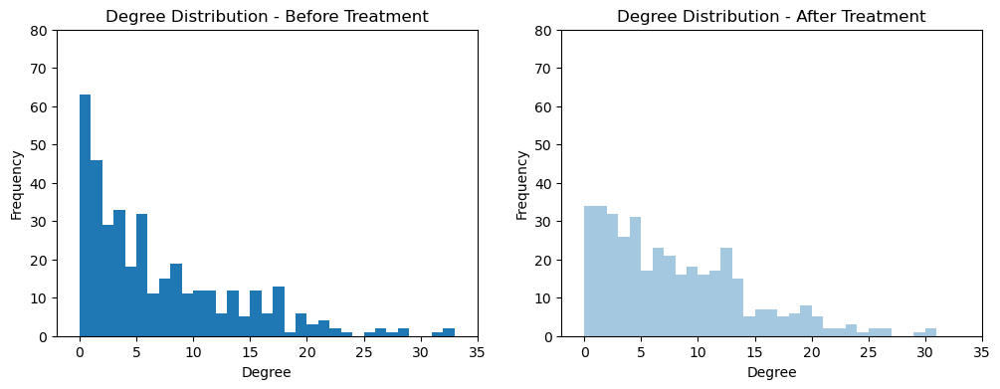

In [9]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

axs[0].hist(before_degrees, bins=range(0, max(before_degrees) + 2))
axs[0].set_xlim(-2, 35)
axs[0].set_ylim(0, 80)
axs[0].set_xlabel('Degree')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Degree Distribution - Before Treatment')

axs[1].hist(after_degrees, bins=range(0, max(after_degrees) + 2, 1), alpha=0.4)
axs[1].set_xlim(-2, 35)
axs[1].set_ylim(0, 80)
axs[1].set_xlabel('Degree')
axs[1].set_ylabel('Frequency')
axs[1].set_title('Degree Distribution - After Treatment')

plt.savefig("hist.jpg")
plt.show()

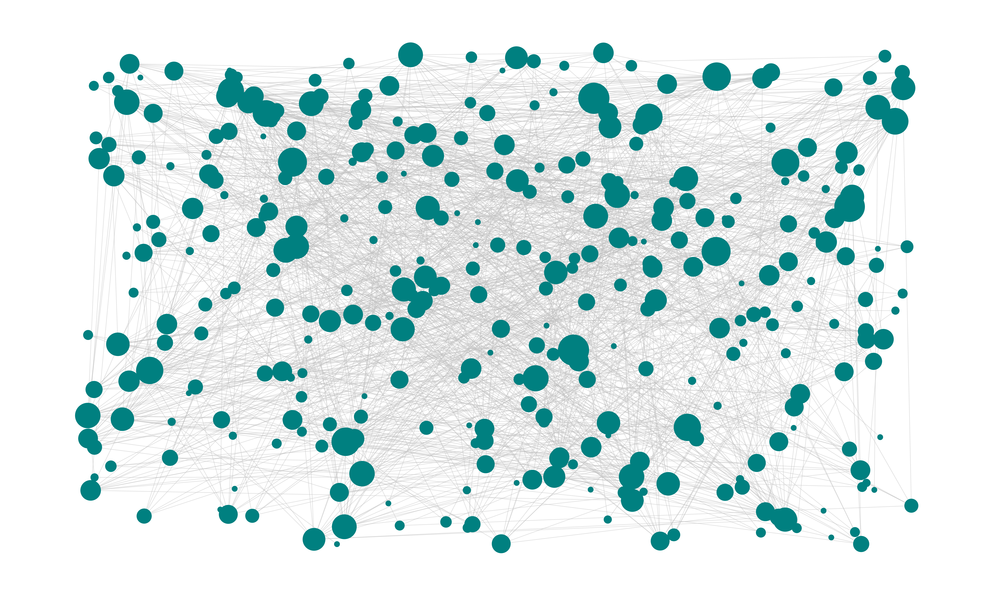

In [22]:
draw_graph(after_graph, node_size = "node_degree")